In [1]:
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
import math
df = pd.read_csv("C:\\Users\\User\\OneDrive\\Documents\diabetes_binary_5050split_health_indicators_BRFSS2015.csv")

In [2]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,StandardScaler,MinMaxScaler,PowerTransformer,FunctionTransformer
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.metrics import confusion_matrix,classification_report,ConfusionMatrixDisplay
from sklearn.linear_model import LogisticRegression,RidgeClassifier,LassoCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, plot_confusion_matrix


In [3]:
#load the dataset
df=pd.read_csv("diabetes_binary_5050split_health_indicators_BRFSS2015.csv")
df.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,3.0,5.0,30.0,0.0,1.0,4.0,6.0,8.0
1,0.0,1.0,1.0,1.0,26.0,1.0,1.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,12.0,6.0,8.0
2,0.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,10.0,0.0,1.0,13.0,6.0,8.0
3,0.0,1.0,1.0,1.0,28.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,3.0,0.0,1.0,11.0,6.0,8.0
4,0.0,0.0,0.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,8.0,5.0,8.0


In [4]:
#check the rows and columns number.
print(f"number of rows:--> {df.shape[0]} and number of columns:--> {df.shape[1]}")

number of rows:--> 70692 and number of columns:--> 22


In [5]:
df.shape

(70692, 22)

In [6]:
#chack the data information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70692 entries, 0 to 70691
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_binary       70692 non-null  float64
 1   HighBP                70692 non-null  float64
 2   HighChol              70692 non-null  float64
 3   CholCheck             70692 non-null  float64
 4   BMI                   70692 non-null  float64
 5   Smoker                70692 non-null  float64
 6   Stroke                70692 non-null  float64
 7   HeartDiseaseorAttack  70692 non-null  float64
 8   PhysActivity          70692 non-null  float64
 9   Fruits                70692 non-null  float64
 10  Veggies               70692 non-null  float64
 11  HvyAlcoholConsump     70692 non-null  float64
 12  AnyHealthcare         70692 non-null  float64
 13  NoDocbcCost           70692 non-null  float64
 14  GenHlth               70692 non-null  float64
 15  MentHlth           

In [7]:
#check for missing numbers
def checking_m(df):
    null_v = df.isnull().sum().sort_values(ascending=False)
    null_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    null_v = pd.concat([null_v, null_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return null_v

checking_m(df)

,Missing_Number,Missing_Percent
Diabetes_binary,0,0.0
HighBP,0,0.0
Education,0,0.0
Age,0,0.0
Sex,0,0.0
DiffWalk,0,0.0
PhysHlth,0,0.0
MentHlth,0,0.0
GenHlth,0,0.0
NoDocbcCost,0,0.0


In [8]:
#check for dublicated rows
print("Numbers of duplicated rows :",df.duplicated().sum())

Numbers of duplicated rows : 1635


In [9]:
#dropping the duplicated rows 
df=df.drop_duplicates(keep="first")
print("After removing,now number of duplicated rows are:",df.duplicated().sum())

After removing,now number of duplicated rows are: 0


In [10]:
#check data description
df.describe().T.style.bar(subset=['mean'], color='#205ff2').background_gradient(subset=['std'], cmap='mako').background_gradient(subset=['50%'], cmap='coolwarm')

,count,mean,std,min,25%,50%,75%,max
Diabetes_binary,69057.000000,0.508232,0.499936,0.000000,0.000000,1.000000,1.000000,1.000000
HighBP,69057.000000,0.571224,0.494905,0.000000,0.000000,1.000000,1.000000,1.000000
HighChol,69057.000000,0.531329,0.499021,0.000000,0.000000,1.000000,1.000000,1.000000
CholCheck,69057.000000,0.974803,0.156723,0.000000,1.000000,1.000000,1.000000,1.000000
BMI,69057.000000,29.955834,7.147972,12.000000,25.000000,29.000000,33.000000,98.000000
Smoker,69057.000000,0.481935,0.499677,0.000000,0.000000,0.000000,1.000000,1.000000
Stroke,69057.000000,0.063643,0.244118,0.000000,0.000000,0.000000,0.000000,1.000000
HeartDiseaseorAttack,69057.000000,0.150875,0.357930,0.000000,0.000000,0.000000,0.000000,1.000000
PhysActivity,69057.000000,0.696483,0.459780,0.000000,0.000000,1.000000,1.000000,1.000000
Fruits,69057.000000,0.605659,0.488712,0.000000,0.000000,1.000000,1.000000,1.000000


In [11]:
#check the correlation between terget and each of columns
df.corr()["Diabetes_binary"]

Diabetes_binary         1.000000
HighBP                  0.372048
HighChol                0.281399
CholCheck               0.118900
BMI                     0.285643
Smoker                  0.075853
Stroke                  0.122727
HeartDiseaseorAttack    0.207229
PhysActivity           -0.150281
Fruits                 -0.044560
Veggies                -0.072181
HvyAlcoholConsump      -0.098709
AnyHealthcare           0.027034
NoDocbcCost             0.036145
GenHlth                 0.396571
MentHlth                0.080688
PhysHlth                0.206868
DiffWalk                0.267082
Sex                     0.042538
Age                     0.274550
Education              -0.158522
Income                 -0.212846
Name: Diabetes_binary, dtype: float64

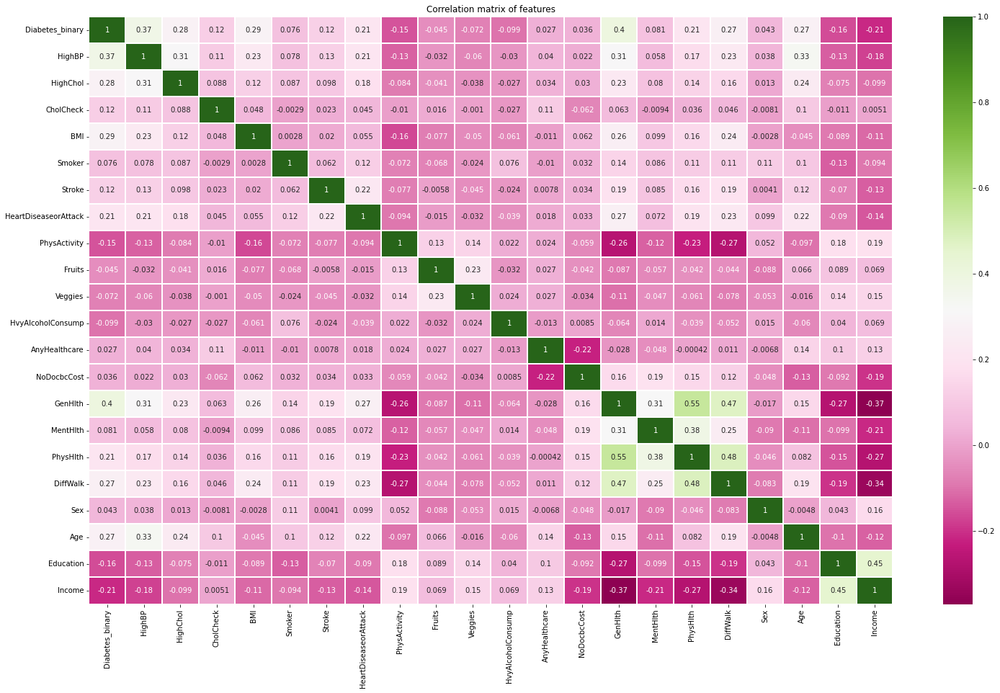

In [12]:
corr = df.corr()
fig, ax = plt.subplots(figsize=(25,15)) 
sns.heatmap(corr,annot=True, cmap = "PiYG", linewidth = 0.30)
plt.title("Correlation matrix of features")
plt.show()

In [13]:
df.Diabetes_binary.value_counts()

1.0    35097
0.0    33960
Name: Diabetes_binary, dtype: int64

C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Diabetes_binary', ylabel='count'>

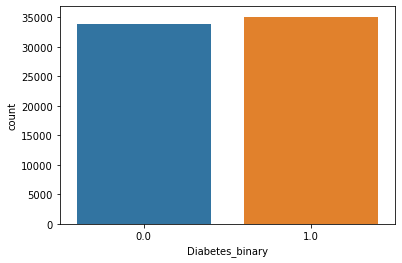

In [14]:
sns.countplot(df.Diabetes_binary)

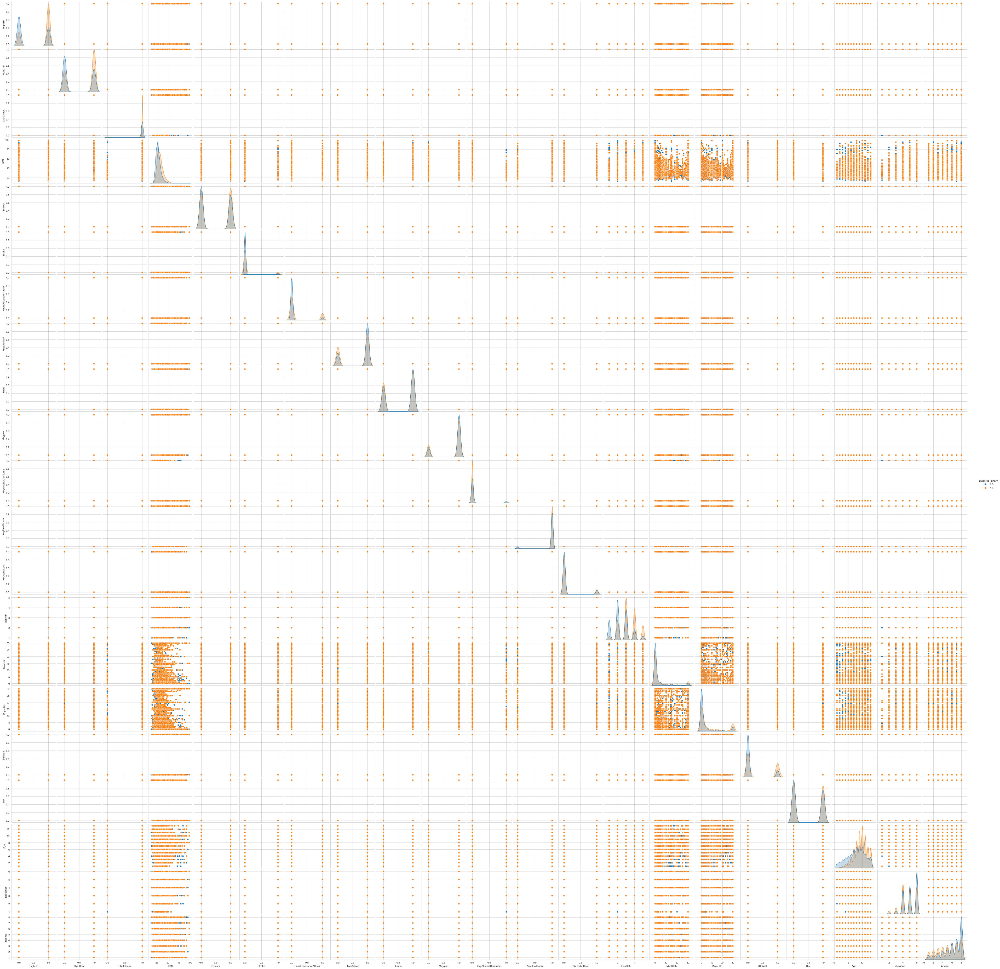

In [23]:
plt.close();
sns.set_style("whitegrid")
sns.pairplot(df,hue="Diabetes_binary");

In [15]:
X=df.drop("Diabetes_binary",axis=1)
y=df.Diabetes_binary

# Mutual Information

In [16]:
from sklearn.feature_selection import mutual_info_classif
# determine the mutual information
mutual_info = mutual_info_classif(X, y)
mutual_info

array([0.07204112, 0.04093623, 0.01640914, 0.0512944 , 0.00173092,
       0.00654284, 0.02660332, 0.01841375, 0.00388172, 0.00673628,
       0.00422861, 0.00740343, 0.00272597, 0.08768582, 0.00241569,
       0.02498593, 0.03615495, 0.0025766 , 0.046824  , 0.01651403,
       0.02798516])

In [17]:
mutual_info = pd.Series(mutual_info)
mutual_info.index = X.columns
mutual_info.sort_values(ascending=False)

GenHlth                 0.087686
HighBP                  0.072041
BMI                     0.051294
Age                     0.046824
HighChol                0.040936
DiffWalk                0.036155
Income                  0.027985
HeartDiseaseorAttack    0.026603
PhysHlth                0.024986
PhysActivity            0.018414
Education               0.016514
CholCheck               0.016409
AnyHealthcare           0.007403
Veggies                 0.006736
Stroke                  0.006543
HvyAlcoholConsump       0.004229
Fruits                  0.003882
NoDocbcCost             0.002726
Sex                     0.002577
MentHlth                0.002416
Smoker                  0.001731
dtype: float64

<AxesSubplot:>

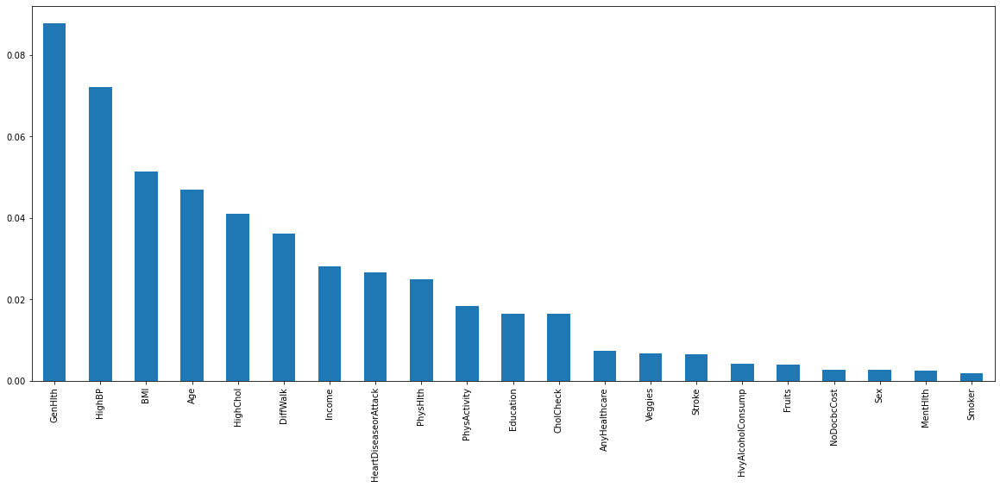

In [18]:
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20,8))

In [19]:
df.drop('NoDocbcCost',axis = 1,inplace= True)

In [20]:
df.shape

(69057, 21)

In [21]:
df.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,5.0,30.0,0.0,1.0,4.0,6.0,8.0
1,0.0,1.0,1.0,1.0,26.0,1.0,1.0,0.0,0.0,1.0,...,0.0,1.0,3.0,0.0,0.0,0.0,1.0,12.0,6.0,8.0
2,0.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,...,0.0,1.0,1.0,0.0,10.0,0.0,1.0,13.0,6.0,8.0
3,0.0,1.0,1.0,1.0,28.0,1.0,0.0,0.0,1.0,1.0,...,0.0,1.0,3.0,0.0,3.0,0.0,1.0,11.0,6.0,8.0
4,0.0,0.0,0.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,...,0.0,1.0,2.0,0.0,0.0,0.0,0.0,8.0,5.0,8.0


In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69057 entries, 0 to 70691
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_binary       69057 non-null  float64
 1   HighBP                69057 non-null  float64
 2   HighChol              69057 non-null  float64
 3   CholCheck             69057 non-null  float64
 4   BMI                   69057 non-null  float64
 5   Smoker                69057 non-null  float64
 6   Stroke                69057 non-null  float64
 7   HeartDiseaseorAttack  69057 non-null  float64
 8   PhysActivity          69057 non-null  float64
 9   Fruits                69057 non-null  float64
 10  Veggies               69057 non-null  float64
 11  HvyAlcoholConsump     69057 non-null  float64
 12  AnyHealthcare         69057 non-null  float64
 13  GenHlth               69057 non-null  float64
 14  MentHlth              69057 non-null  float64
 15  PhysHlth           

In [23]:
df.drop('Sex',axis = 1,inplace= True)
df.drop('HvyAlcoholConsump',axis = 1,inplace= True)
df.drop('Fruits',axis = 1,inplace= True)
df.drop('MentHlth',axis = 1,inplace= True)
df.drop('Smoker',axis = 1,inplace= True)



In [24]:
df.shape

(69057, 16)

In [25]:
df.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Stroke,HeartDiseaseorAttack,PhysActivity,Veggies,AnyHealthcare,GenHlth,PhysHlth,DiffWalk,Age,Education,Income
0,0.0,1.0,0.0,1.0,26.0,0.0,0.0,1.0,1.0,1.0,3.0,30.0,0.0,4.0,6.0,8.0
1,0.0,1.0,1.0,1.0,26.0,1.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,12.0,6.0,8.0
2,0.0,0.0,0.0,1.0,26.0,0.0,0.0,1.0,1.0,1.0,1.0,10.0,0.0,13.0,6.0,8.0
3,0.0,1.0,1.0,1.0,28.0,0.0,0.0,1.0,1.0,1.0,3.0,3.0,0.0,11.0,6.0,8.0
4,0.0,0.0,0.0,1.0,29.0,0.0,0.0,1.0,1.0,1.0,2.0,0.0,0.0,8.0,5.0,8.0


In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69057 entries, 0 to 70691
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_binary       69057 non-null  float64
 1   HighBP                69057 non-null  float64
 2   HighChol              69057 non-null  float64
 3   CholCheck             69057 non-null  float64
 4   BMI                   69057 non-null  float64
 5   Stroke                69057 non-null  float64
 6   HeartDiseaseorAttack  69057 non-null  float64
 7   PhysActivity          69057 non-null  float64
 8   Veggies               69057 non-null  float64
 9   AnyHealthcare         69057 non-null  float64
 10  GenHlth               69057 non-null  float64
 11  PhysHlth              69057 non-null  float64
 12  DiffWalk              69057 non-null  float64
 13  Age                   69057 non-null  float64
 14  Education             69057 non-null  float64
 15  Income             

In [27]:
# separating the data and labels
X = df.drop(columns = 'Diabetes_binary', axis=1)
Y = df['Diabetes_binary']

In [28]:
print(X)

       HighBP  HighChol  CholCheck   BMI  Stroke  HeartDiseaseorAttack  \
0         1.0       0.0        1.0  26.0     0.0                   0.0   
1         1.0       1.0        1.0  26.0     1.0                   0.0   
2         0.0       0.0        1.0  26.0     0.0                   0.0   
3         1.0       1.0        1.0  28.0     0.0                   0.0   
4         0.0       0.0        1.0  29.0     0.0                   0.0   
...       ...       ...        ...   ...     ...                   ...   
70687     0.0       1.0        1.0  37.0     0.0                   0.0   
70688     0.0       1.0        1.0  29.0     0.0                   1.0   
70689     1.0       1.0        1.0  25.0     0.0                   1.0   
70690     1.0       1.0        1.0  18.0     0.0                   0.0   
70691     1.0       1.0        1.0  25.0     0.0                   1.0   

       PhysActivity  Veggies  AnyHealthcare  GenHlth  PhysHlth  DiffWalk  \
0               1.0      1.0       

In [29]:
print(Y)

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
70687    1.0
70688    1.0
70689    1.0
70690    1.0
70691    1.0
Name: Diabetes_binary, Length: 69057, dtype: float64


In [30]:
#It is a good practise to split the data to avoiding the data leakage 
#train test split  
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.2,random_state=42)
print("X_train shape: ",x_train.shape)
print("X_test shape: ",x_test.shape)
print("Y_train shape: ",y_train.shape)
print("Y_test shape: ",y_test.shape)

X_train shape:  (55245, 15)
X_test shape:  (13812, 15)
Y_train shape:  (55245,)
Y_test shape:  (13812,)


# Normalization

In [31]:
from sklearn.preprocessing import StandardScaler
std=StandardScaler()

In [32]:
x_train=std.fit_transform(x_train)
x_test=std.transform(x_test)

In [33]:
x_train

array([[-1.15446282,  0.93912842,  0.16089202, ...,  0.48773474,
         0.09997527,  0.62064079],
       [ 0.86620373, -1.0648171 ,  0.16089202, ...,  1.53531866,
         1.07099034,  0.62064079],
       [ 0.86620373,  0.93912842,  0.16089202, ..., -0.21065453,
        -0.8710398 , -1.22167291],
       ...,
       [ 0.86620373,  0.93912842,  0.16089202, ...,  1.18612402,
        -1.84205487, -1.22167291],
       [-1.15446282, -1.0648171 ,  0.16089202, ..., -0.55984917,
        -0.8710398 , -1.22167291],
       [-1.15446282, -1.0648171 ,  0.16089202, ..., -1.60743309,
         1.07099034,  1.08121921]])

# Machine Learning

In [34]:
import time

In [35]:
#training accuracy

start_time=time.time()
lr=LogisticRegression()
lr.fit(x_train, y_train)
end_time=time.time()

y_pred=lr.predict(x_test) 

#printing the model name and accuracy !!!!!
print("Training time:",end_time-start_time,"Seconds")
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")



Training time: 0.05519270896911621 Seconds
Accuracy :--->> 0.7484795829713293

              precision    recall  f1-score   support

         0.0       0.75      0.73      0.74      6723
         1.0       0.75      0.77      0.76      7089

    accuracy                           0.75     13812
   macro avg       0.75      0.75      0.75     13812
weighted avg       0.75      0.75      0.75     13812

Confusion matrix:--->>
 [[4881 1842]
 [1632 5457]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

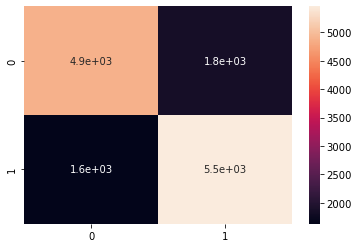

In [36]:
# calculating and plotting the confusion matrix
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)

In [37]:
#training accuracy
start_time=time.time()
rf=RandomForestClassifier()
rf.fit(x_train, y_train)
end_time=time.time()
y_pred=rf.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Training time:",end_time-start_time,"Seconds")
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")

Training time: 4.492550373077393 Seconds
Accuracy :--->> 0.7267593397046047

              precision    recall  f1-score   support

         0.0       0.73      0.69      0.71      6723
         1.0       0.72      0.76      0.74      7089

    accuracy                           0.73     13812
   macro avg       0.73      0.73      0.73     13812
weighted avg       0.73      0.73      0.73     13812

Confusion matrix:--->>
 [[4662 2061]
 [1713 5376]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

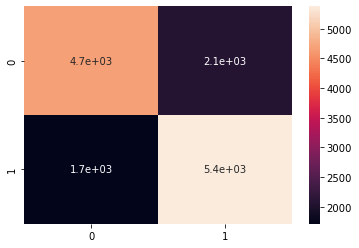

In [38]:
# calculating and plotting the confusion matrix
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)

In [39]:
#training accuracy
start_time=time.time()
dt=DecisionTreeClassifier()
dt.fit(x_train, y_train)
end_time=time.time()
y_pred=dt.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Training time:",end_time-start_time,"Seconds")
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")

Training time: 0.23417115211486816 Seconds
Accuracy :--->> 0.6564581523313061

              precision    recall  f1-score   support

         0.0       0.64      0.68      0.66      6723
         1.0       0.68      0.63      0.65      7089

    accuracy                           0.66     13812
   macro avg       0.66      0.66      0.66     13812
weighted avg       0.66      0.66      0.66     13812

Confusion matrix:--->>
 [[4574 2149]
 [2596 4493]]

<<<<------------------------------------------------------------->>>>



In [40]:
#training accuracy
start_time=time.time()
ab=AdaBoostClassifier()
ab.fit(x_train, y_train)
end_time=time.time()
y_pred=ab.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Training time:",end_time-start_time,"Seconds")
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")

Training time: 1.7205405235290527 Seconds
Accuracy :--->> 0.7541268462206777

              precision    recall  f1-score   support

         0.0       0.76      0.73      0.74      6723
         1.0       0.75      0.78      0.76      7089

    accuracy                           0.75     13812
   macro avg       0.75      0.75      0.75     13812
weighted avg       0.75      0.75      0.75     13812

Confusion matrix:--->>
 [[4892 1831]
 [1565 5524]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

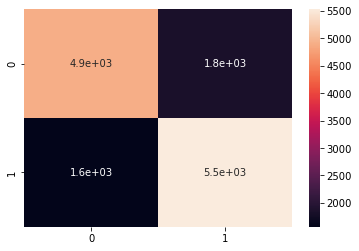

In [41]:
# calculating and plotting the confusion matrix
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)


In [42]:
#training accuracy
start_time=time.time()
xgb=XGBClassifier(learning_rate=0.1,n_estimators=50)
xgb.fit(x_train, y_train)
end_time=time.time()
y_pred=xgb.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Training time:",end_time-start_time,"Seconds")
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")

Training time: 0.5578134059906006 Seconds
Accuracy :--->> 0.7539096437880104

              precision    recall  f1-score   support

         0.0       0.77      0.71      0.74      6723
         1.0       0.74      0.80      0.77      7089

    accuracy                           0.75     13812
   macro avg       0.76      0.75      0.75     13812
weighted avg       0.75      0.75      0.75     13812

Confusion matrix:--->>
 [[4757 1966]
 [1433 5656]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

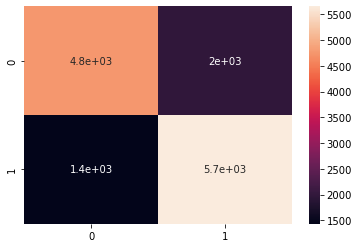

In [43]:
# calculating and plotting the confusion matrix
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)

In [44]:
#training accuracy
start_time=time.time()
gnb=GaussianNB()
gnb.fit(x_train, y_train)
end_time=time.time()
y_pred=gnb.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Training time:",end_time-start_time,"Seconds")
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")

Training time: 0.03789329528808594 Seconds
Accuracy :--->> 0.7208224732117

              precision    recall  f1-score   support

         0.0       0.70      0.74      0.72      6723
         1.0       0.74      0.70      0.72      7089

    accuracy                           0.72     13812
   macro avg       0.72      0.72      0.72     13812
weighted avg       0.72      0.72      0.72     13812

Confusion matrix:--->>
 [[4989 1734]
 [2122 4967]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

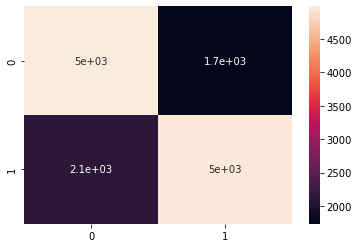

In [45]:
# calculating and plotting the confusion matrix
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)

Accuracy :--->> 0.7127135823921228

              precision    recall  f1-score   support

         0.0       0.71      0.69      0.70      6723
         1.0       0.71      0.74      0.72      7089

    accuracy                           0.71     13812
   macro avg       0.71      0.71      0.71     13812
weighted avg       0.71      0.71      0.71     13812

Confusion matrix:--->>
 [[4624 2099]
 [1869 5220]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

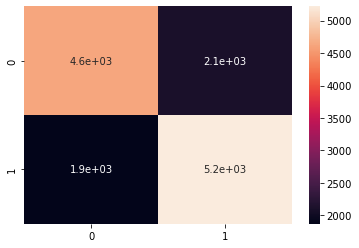

In [46]:
import time
start_time=time.time()
knn = KNeighborsClassifier()
knn.fit(x_train, y_train)
end_time=time.time()
y_pred=knn.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)

# Deep Learning

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dense, Dropout, Flatten, Conv1D, MaxPool1D
from keras.optimizers import RMSprop,Adam
from tensorflow.keras.layers import Embedding
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import one_hot
from tensorflow.keras.layers import LSTM, Dense
import tensorflow as tf

In [49]:
df.shape

(69057, 16)

In [48]:
# Define the model architecture
model = Sequential()
model.add(Dense(16, input_dim=15, activation='relu'))
model.add(Dense(32, input_dim=15, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
callback = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=80)

# Train the model
history=model.fit(x_train, y_train,validation_data=(x_test,y_test), epochs=20, batch_size=20, callbacks=callback)

Epoch 1/20
2763/2763 [==============================] - 5s 1ms/step - loss: 0.5276 - accuracy: 0.7345 - val_loss: 0.5112 - val_accuracy: 0.7514
Epoch 2/20
2763/2763 [==============================] - 4s 1ms/step - loss: 0.5167 - accuracy: 0.7440 - val_loss: 0.5083 - val_accuracy: 0.7545
Epoch 3/20
2763/2763 [==============================] - 4s 1ms/step - loss: 0.5150 - accuracy: 0.7440 - val_loss: 0.5083 - val_accuracy: 0.7562
Epoch 4/20
2763/2763 [==============================] - 4s 2ms/step - loss: 0.5148 - accuracy: 0.7442 - val_loss: 0.5089 - val_accuracy: 0.7554
Epoch 5/20
2763/2763 [==============================] - 4s 1ms/step - loss: 0.5138 - accuracy: 0.7460 - val_loss: 0.5076 - val_accuracy: 0.7565
Epoch 6/20
2763/2763 [==============================] - 4s 1ms/step - loss: 0.5131 - accuracy: 0.7458 - val_loss: 0.5054 - val_accuracy: 0.7562
Epoch 7/20
2763/2763 [==============================] - 4s 1ms/step - loss: 0.5127 - accuracy: 0.7452 - val_loss: 0.5055 - val_accuracy:

In [50]:
y_pred=model.predict(x_test)
y_pred=(y_pred>0.5)

NameError: name 'model' is not defined

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm=confusion_matrix(y_test,y_pred)

Text(69.0, 0.5, 'Predicted Values')

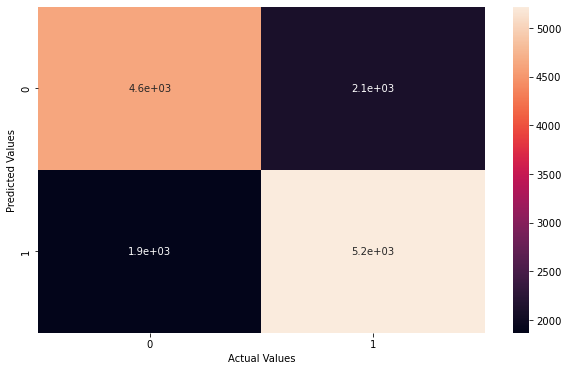

In [54]:
plt.figure(figsize=(10,6))
sns.heatmap(cm,annot=True)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

In [55]:
accuracy_score(y_test,y_pred)

0.7127135823921228

In [56]:
# Print the evaluation metrics for the dataset.
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.71      0.69      0.70      6723
         1.0       0.71      0.74      0.72      7089

    accuracy                           0.71     13812
   macro avg       0.71      0.71      0.71     13812
weighted avg       0.71      0.71      0.71     13812



In [57]:
accuracy = history.history['accuracy']
accuracy_val = history.history['val_accuracy']
loss = history.history['loss']
loss_val = history.history['val_loss']

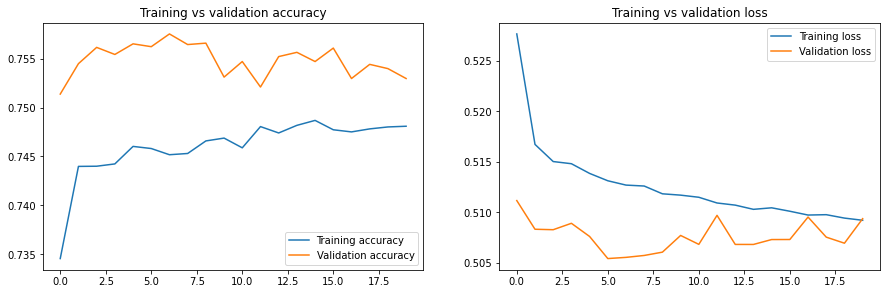

In [58]:
plt.figure(figsize=(15,10))

plt.subplot(2, 2, 1)
plt.plot(accuracy, label = "Training accuracy")
plt.plot(accuracy_val, label = "Validation accuracy")
plt.legend()
plt.title("Training vs validation accuracy")


plt.subplot(2,2,2)
plt.plot(loss, label = "Training loss")
plt.plot(loss_val, label = "Validation loss")
plt.legend()
plt.title("Training vs validation loss")

plt.show()

# LIME

In [62]:
import lime
import lime.lime_tabular
import numpy as np
import pandas as pd

In [63]:
# Split the data into train and test data:
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size = 0.2)

In [64]:
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X),  
mode='classification',verbose=True,feature_names=X.columns)

In [65]:
X_test.iloc[0:5]

,HighBP,HighChol,CholCheck,BMI,Stroke,HeartDiseaseorAttack,PhysActivity,Veggies,AnyHealthcare,GenHlth,PhysHlth,DiffWalk,Age,Education,Income
36778,1.0,1.0,1.0,37.0,0.0,1.0,1.0,1.0,1.0,3.0,30.0,1.0,11.0,6.0,5.0
32974,1.0,0.0,1.0,27.0,0.0,0.0,1.0,1.0,1.0,2.0,1.0,0.0,7.0,4.0,6.0
55570,0.0,0.0,1.0,45.0,0.0,1.0,0.0,0.0,1.0,3.0,0.0,1.0,11.0,2.0,2.0
65599,0.0,1.0,1.0,27.0,0.0,0.0,1.0,1.0,1.0,2.0,0.0,0.0,10.0,6.0,7.0
53391,1.0,1.0,1.0,39.0,0.0,0.0,0.0,0.0,1.0,3.0,15.0,0.0,6.0,3.0,3.0


In [66]:
Y_test.iloc[0:5]

36778    1.0
32974    0.0
55570    1.0
65599    1.0
53391    1.0
Name: Diabetes_binary, dtype: float64

In [67]:
exp1 = explainer.explain_instance(X_test.iloc[1].values,lr.predict_proba, num_features=15)
exp1.show_in_notebook(show_table=True)

Intercept 0.9999998878847062
Prediction_local [0.99999978]
Right: 0.9999999897186956


In [68]:
exp2 = explainer.explain_instance(X_test.iloc[1].astype(int).values,rf.predict_proba, num_features=15)
exp2.show_in_notebook(show_table=True)

Intercept 0.8779580486414844
Prediction_local [0.69627391]
Right: 0.75


In [69]:
exp3 = explainer.explain_instance(X_test.iloc[1].astype(int).values,dt.predict_proba, num_features=15)
exp3.show_in_notebook(show_table=True)

Intercept 1.0
Prediction_local [1.]
Right: 1.0


In [70]:
exp4 = explainer.explain_instance(X_test.iloc[1].astype(int).values,ab.predict_proba, num_features=15)
exp4.show_in_notebook(show_table=True)

Intercept 0.5098695068662816
Prediction_local [0.50782491]
Right: 0.5080456793464934


In [71]:
exp5 = explainer.explain_instance(X_test.iloc[1].astype(int).values,xgb.predict_proba, num_features=15)
exp5.show_in_notebook(show_table=True)

Intercept 0.9087372690667711
Prediction_local [0.83239068]
Right: 0.85609573


In [72]:
exp6 = explainer.explain_instance(X_test.iloc[1].astype(int).values,gnb.predict_proba, num_features=15)
exp6.show_in_notebook(show_table=True)

Intercept 1.0000000000033864
Prediction_local [1.]
Right: 1.0


In [73]:
exp7 = explainer.explain_instance(X_test.iloc[1].astype(int).values,knn.predict_proba, num_features=15)
exp7.show_in_notebook(show_table=True)

Intercept 0.7294682701515548
Prediction_local [0.71180758]
Right: 0.6


In [74]:
exp1.as_list()

[('Age <= 7.00', -3.102472177132281e-07),
 ('25.00 < BMI <= 29.00', 1.627224108528743e-07),
 ('GenHlth <= 2.00', -1.5195164266068208e-07),
 ('0.00 < PhysHlth <= 6.00', 1.0568251328750344e-07),
 ('HighChol <= 0.00', -7.176529823572002e-08),
 ('0.00 < HighBP <= 1.00', 4.7026471165988945e-08),
 ('DiffWalk <= 0.00', 4.164318565547751e-08),
 ('Education <= 4.00', 4.108367613810486e-08),
 ('HeartDiseaseorAttack <= 0.00', 2.5076914179099772e-08),
 ('Stroke <= 0.00', 2.381114634494632e-08),
 ('4.00 < Income <= 6.00', -1.3444464724656911e-08),
 ('0.00 < PhysActivity <= 1.00', -1.0914506111262112e-08),
 ('Veggies <= 1.00', 0.0),
 ('CholCheck <= 1.00', 0.0),
 ('AnyHealthcare <= 1.00', 0.0)]

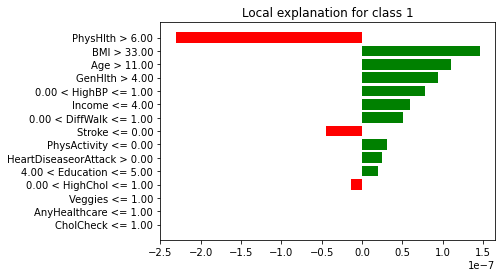

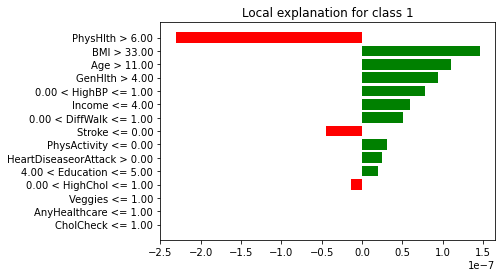

In [72]:
exp1.as_pyplot_figure()

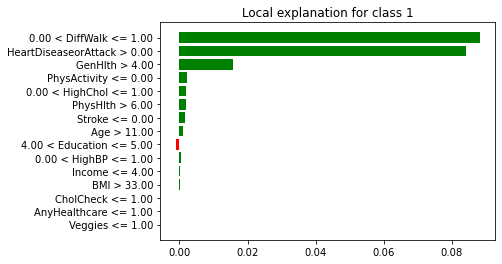

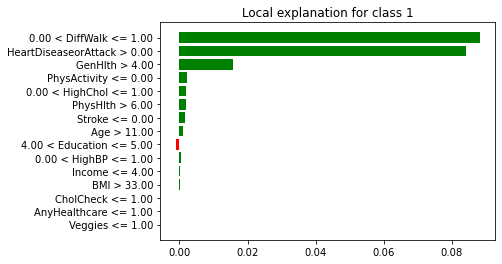

In [73]:
exp2.as_pyplot_figure()

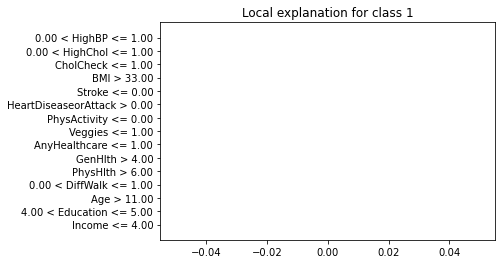

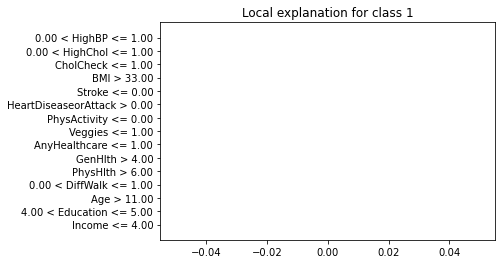

In [74]:
exp3.as_pyplot_figure()

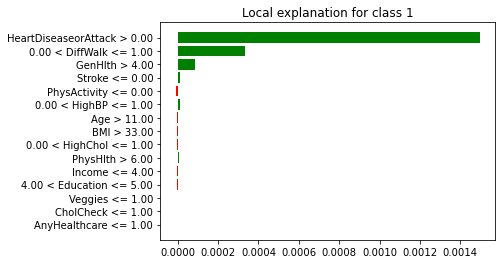

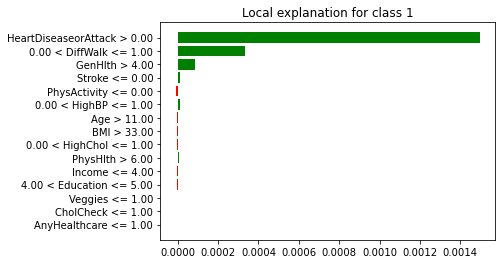

In [75]:
exp4.as_pyplot_figure()

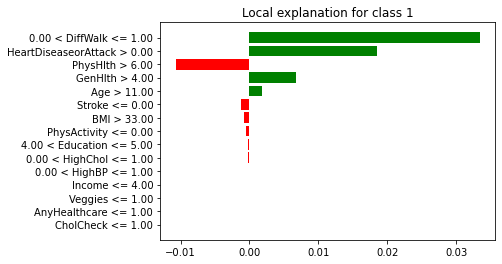

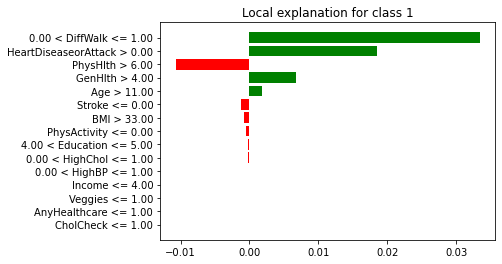

In [76]:
exp5.as_pyplot_figure()

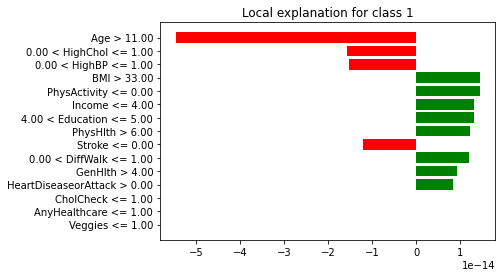

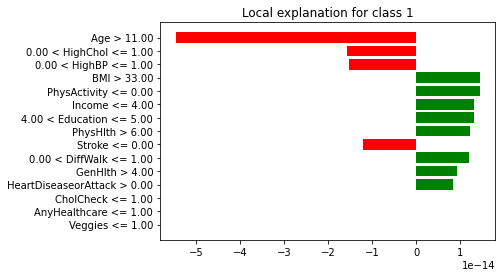

In [77]:
exp6.as_pyplot_figure()

In [78]:
exp7.as_list()

[('PhysHlth > 6.00', 0.22046371658789898),
 ('BMI > 33.00', -0.053630359183884854),
 ('Income <= 4.00', 0.051574001462958124),
 ('0.00 < HighBP <= 1.00', 0.024650821478094838),
 ('HeartDiseaseorAttack > 0.00', 0.01711845450746993),
 ('PhysActivity <= 0.00', 0.013431953277858148),
 ('Age > 11.00', 0.010428623420665537),
 ('GenHlth > 4.00', 0.0066019851882500175),
 ('0.00 < DiffWalk <= 1.00', 0.004182399621022583),
 ('0.00 < HighChol <= 1.00', -0.002806406877033341),
 ('Stroke <= 0.00', 0.0004690063484293238),
 ('4.00 < Education <= 5.00', 0.000137907450136943),
 ('Veggies <= 1.00', 0.0),
 ('AnyHealthcare <= 1.00', 0.0),
 ('CholCheck <= 1.00', 0.0)]

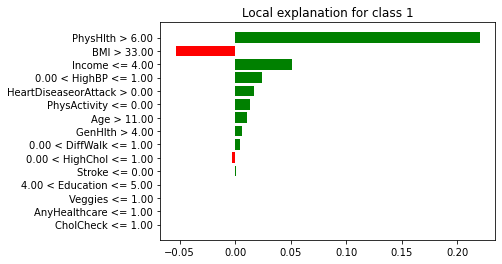

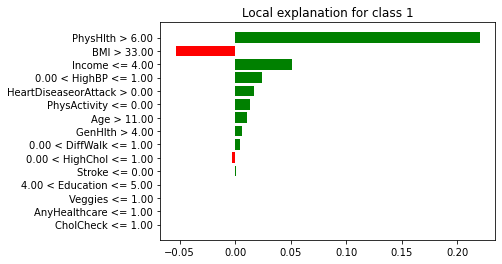

In [79]:
exp7.as_pyplot_figure()

# SHAP

In [76]:
import shap


In [77]:
shap.initjs()


 98%|===================| 13589/13812 [00:13<00:00]        

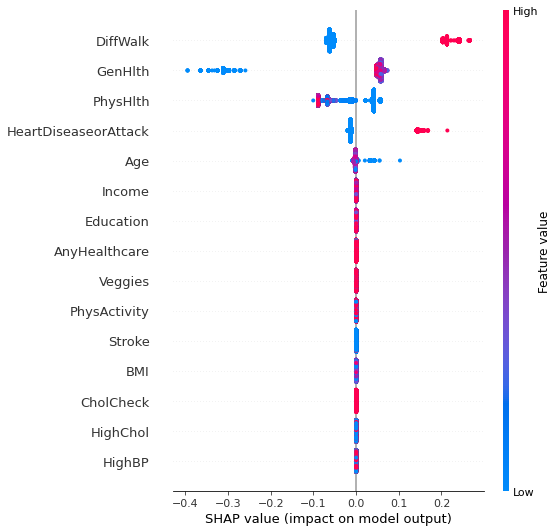

In [78]:
explainer1 = shap.TreeExplainer(xgb,X_train)
shap_values_xgb =explainer1.shap_values(X_test)
shap.summary_plot(shap_values_xgb,X_test)

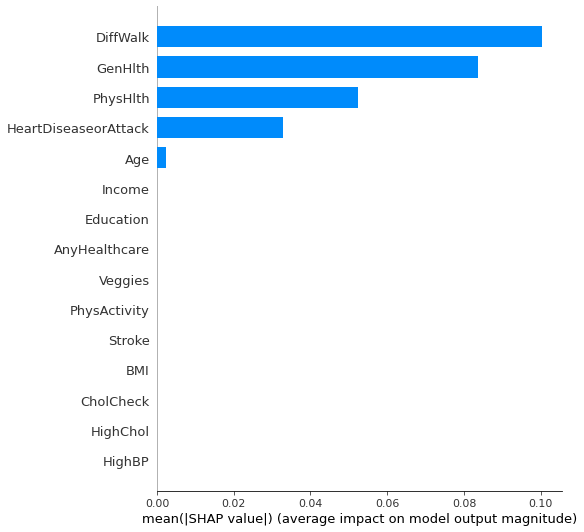

In [79]:
shap.summary_plot(shap_values_xgb,X_test,plot_type="bar")

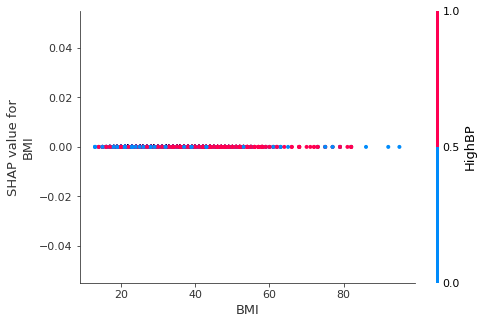

In [83]:
shap.dependence_plot("BMI",shap_values_xgb, X_test)

In [80]:
shap.force_plot(explainer1.expected_value,shap_values_xgb[7,:], X_test.iloc[7,:])

Logistic regression

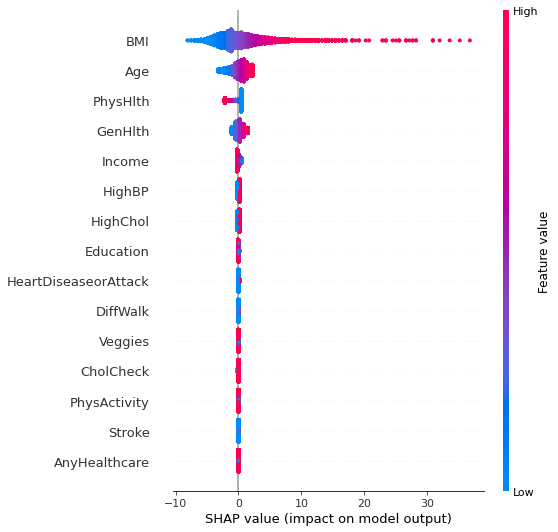

In [81]:
explainer2 =shap.Explainer(lr,X_train)
shap_values_lr = explainer2.shap_values(X_test)
shap.summary_plot(shap_values_lr,X_test)

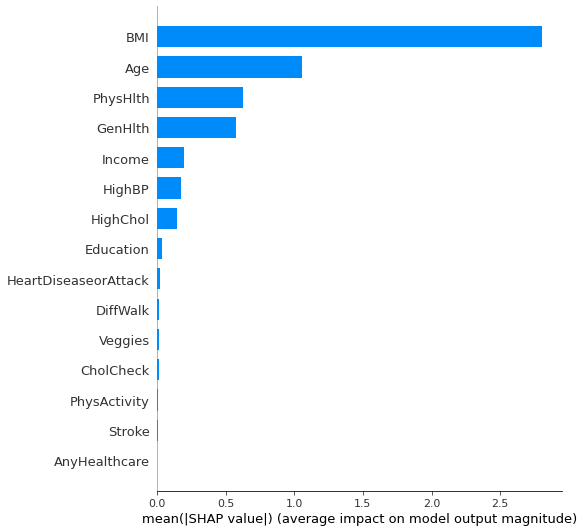

In [82]:
shap.summary_plot(shap_values_lr,X_test,plot_type="bar")

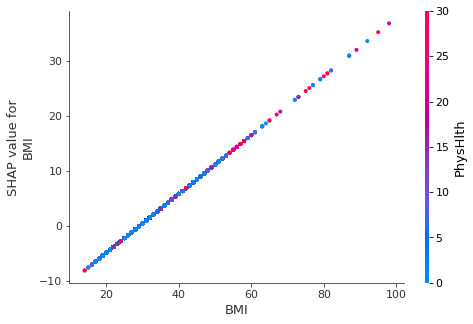

In [83]:
shap.dependence_plot("BMI",shap_values_lr, X_test)

In [84]:
shap.force_plot(explainer2.expected_value,shap_values_lr[7,:], X_test.iloc[7,:])

Random Forest

100%|===================| 27605/27624 [04:08<00:00]        

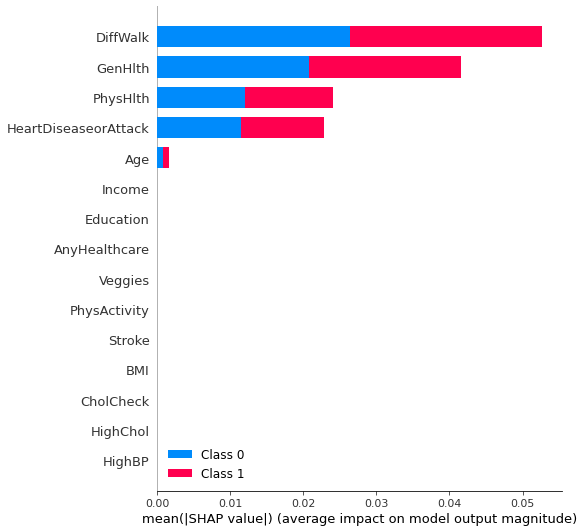

In [85]:
explainer3 =shap.Explainer(rf,X_train)
shap_values_rf = explainer3.shap_values(X_test)
shap.summary_plot(shap_values_rf,X_test)

In [88]:
shap.force_plot(explainer3.expected_value[1],shap_values_rf[0][7,:] ,X_test.iloc[7,:])
#plt.savefig("shap_rf.png",dpi=300,bbox_inches='tight')


In [91]:
explainer4 =shap.kernelExplainer(gnb,X_train)
shap_values_gnb = explainer4.shap_values(X_test)
#shap.summary_plot(shap_values_gnb,X_test)

AttributeError: module 'shap' has no attribute 'kernelExplainer'

In [94]:
explainer5 =shap.kernelExplainer(ab.predict_proba,X_train)
shap_values_gnb = explainer5.shap_values(X_test)

AttributeError: module 'shap' has no attribute 'kernelExplainer'